In [1]:
from read_telescope import survive_photon, VAtmosAbsorption, filter_photons, survive_photon, get_photon_bunches, plot_4_events_with_ground_particles, save_plotly_animation_to_mp4
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
atmabs_file="/uufs/chpc.utah.edu/common/home/u1520754/corsika-78010/run/atmabs.dat"
atmos = VAtmosAbsorption(model="CORSIKA", seed=12345, source_file=atmabs_file)
survive_photon(600, 100000, 0.5235988, atmos)  # Example usage with wavelength 600 nm, height 100000 m, angle 30 degrees
#log scale for the plots
def plot_results(x_shower_new, y_shower_new, wavelength_new, zem_new):
    # Set the style for dark background
    plt.style.use('dark_background')
    x_shower_new = np.array(x_shower_new)
    y_shower_new = np.array(y_shower_new)
    wavelength_new = np.array(wavelength_new)
    zem_new = np.array(zem_new)

    # Create 2x2 subplot layout
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    fig.patch.set_facecolor('black')  # Set figure background to black

    # Plot 1: Production height histogram
    #axes[0, 0].hist(zem/1e5, bins=int(len(zem)/10), histtype='step', label='zem', color='cyan')
    axes[0, 0].hist(zem_new/1e5, bins=int(len(zem_new)/10), histtype='step', label='zem_new', color='orange')
    axes[0, 0].set_xlabel('Production height (km)', color='white')
    axes[0, 0].set_yscale('log')
    axes[0, 0].set_xscale('log')
    axes[0, 0].set_ylabel('Photon Counts', color='white')
    axes[0, 0].legend()
    axes[0, 0].set_title('Production Height Distribution', color='white')
    axes[0, 0].tick_params(colors='white')

    # Plot 2: Wavelength histogram
    #axes[0, 1].hist(wavelength, bins=100, histtype='step', label='wavelength', color='cyan')
    axes[0, 1].hist(wavelength_new, bins=100, histtype='step', label='wavelength_new', color='orange')
    axes[0, 1].set_yscale('log')
    axes[0, 1].set_xscale('log')
    axes[0, 1].legend()
    axes[0, 1].set_xlabel('Wavelength (nm)', color='white')
    axes[0, 1].set_ylabel('Photon Counts', color='white')
    axes[0, 1].set_title('Wavelength Distribution', color='white')
    axes[0, 1].tick_params(colors='white')

    from matplotlib.colors import LogNorm

    # Plot 3: 2D histogram (R vs wavelength) normalized by 2π*R
    R = np.sqrt(x_shower_new**2 + y_shower_new**2)

    # Create custom 2D histogram
    Bins = 100
    R_bins = np.logspace(np.log10(R[R>0].min()), np.log10(R.max()), Bins+1)  # 50 bins in log space
    wavelength_bins = np.linspace(wavelength_new.min(), wavelength_new.max(), Bins+1)

    # Create 2D histogram
    counts, R_edges, wl_edges = np.histogram2d(R, wavelength_new, bins=[R_bins, wavelength_bins])

    # Calculate bin centers
    R_centers = (R_edges[:-1] + R_edges[1:]) / 2
    wl_centers = (wl_edges[:-1] + wl_edges[1:]) / 2

    # Normalize by 2π*R for each R bin
    R_mesh, wl_mesh = np.meshgrid(R_centers, wl_centers, indexing='ij')
    normalized_counts = counts / (2 * np.pi * R_mesh)

    # Replace zeros and infinities for log scale
    normalized_counts[normalized_counts == 0] = np.nan
    normalized_counts[~np.isfinite(normalized_counts)] = np.nan

    # Plot 
    im3 = axes[1, 0].pcolormesh(R_edges, wl_edges, normalized_counts.T, 
                            cmap='rainbow', norm=LogNorm())
    cbar3 = fig.colorbar(im3, ax=axes[1, 0])
    cbar3.set_label('Counts/(2π*R) (log scale)', rotation=270, labelpad=15, color='white')
    cbar3.ax.yaxis.set_tick_params(color='white')
    cbar3.ax.yaxis.set_ticklabels(cbar3.ax.yaxis.get_ticklabels(), color='white')
    axes[1, 0].set_xlabel('R (cm)', color='white')
    axes[1, 0].set_ylabel('Wavelength (nm)', color='white')
    axes[1, 0].set_xscale('log')
    axes[1, 0].set_title('2D Histogram: R vs Wavelength (normalized)', color='white')
    axes[1, 0].tick_params(colors='white')

    # Plot 4: 2D histogram (X vs Y)
    x_range = [x_shower_new.min(), x_shower_new.max()]
    y_range = [y_shower_new.min(), y_shower_new.max()]
    bins = 200  # You can adjust this

    # Create 2D histogram
    heatmap, xedges, yedges = np.histogram2d(
        x_shower_new, 
        y_shower_new, 
        bins=bins, 
        range=[x_range, y_range]
    )

    # Create the heatmap plot - using LogNorm for better visualization
    im4 = axes[1, 1].imshow(
        heatmap.T,  # Transpose for correct orientation
        origin='lower',
        extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
        aspect='auto',
        cmap='rainbow',  # Changed to match your previous plot
        norm=LogNorm(vmin=1, vmax=heatmap.max())  # Log scale for better visibility
    )

    # Add colorbar
    cbar4 = fig.colorbar(im4, ax=axes[1, 1])
    cbar4.set_label('Counts (log scale)', rotation=270, labelpad=15, color='white')

    # Option 2: Logarithmic scale ticks (if using LogNorm)
    vmin, vmax = im4.norm.vmin, im4.norm.vmax
    # Use 10^n format for better readability with logarithmic scale
    log_ticks = np.logspace(np.log10(vmin), np.log10(vmax), 5)
    cbar4.set_ticks(log_ticks)
    # Format as 10^n notation
    cbar4.set_ticklabels([f'$10^{{{np.round(np.log10(t),1)}}}$' for t in log_ticks])
    cbar4.ax.yaxis.set_tick_params(color='white')
    cbar4.ax.yaxis.set_ticklabels(cbar4.ax.yaxis.get_ticklabels(), color='white')

    axes[1, 1].set_xlabel('X (cm)', color='white')
    axes[1, 1].set_ylabel('Y (cm)', color='white')
    axes[1, 1].set_title('2D Histogram: X vs Y Coordinates', color='white')
    axes[1, 1].tick_params(colors='white')

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()


Atmospheric extinction model: CORSIKA
VAtmosAbsorption: reading atmospheric extinction file (from CORSIKA): /uufs/chpc.utah.edu/common/home/u1520754/corsika-78010/run/atmabs.dat


In [56]:
from read_telescope import IACTFile, read_particle_file, VAtmosAbsorption
import numpy as np
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
def pde_vs_wavelength(wl):
    wavelength = np.array([300, 320, 340, 360, 380, 400, 420, 440, 480, 500, 520, 560, 600, 640, 660, 700])
    pde = np.array([0.28, 0.38, 0.38, 0.38, 0.44, 0.46, 0.48, 0.48, 0.5, 0.5, 0.48, 0.4, 0.34, 0.28, 0.26, 0.22])
    wl1 = int(np.round(wl/20,0)*20)
    index = np.where(wavelength == wl1)[0]
    return pde[index][0] if index.size > 0 else 0.22  # Default value if wavelength not found

def simulate_davied_cotton_optics(X_photon, Y_photon, W_photon, Zem_photon, T_photon, cos_x, cos_y, R = 15000, r_cam = 600, get_mirror_photons=False, plotting=False):
    # 1) compute z on the spherical dish, keep only real hits
    r2 = X_photon**2 + Y_photon**2
    ok = (r2 <= R*R)
    X = X_photon[ok]
    Y = Y_photon[ok]
    W = W_photon[ok] # Wavelength of the photons 
    Zem = Zem_photon[ok]
    T = T_photon[ok] # Time since the first interaction
    # Distance from the mirror surface to the camera plane
    Z = np.sqrt(R*R - r2[ok])
    # 2) incident unit vectors
    # assume v_i.z < 0  i.e. photon travelling towards negative z
    cos_z = np.sqrt(1.0 - cos_x[ok]**2 - cos_y[ok]**2) #cosine of the z direction
    v_i = np.vstack((cos_x[ok], cos_y[ok], -cos_z)).T # incident unit vectors, shape (M,3) Pointing towards the mirror surface
    
    # 3) normals at each hit
    # center of curvature C = (0,0,R)
    # P_hit = (X,Y,Z)
    # so n = (P_hit - C)/R
    #     = (X, Y, Z-R)/R
    R_norm  = R*2 # David-Cotton optics have a radius of curvature of 2*R for the focal point to be at the camera plane
    Z2 = np.sqrt(R_norm**2 - r2[ok]) #Z2 is the z coordinate of the normal vector that point at 2R
    #print(R_norm - Z2)
    n = np.vstack((-X, -Y, R_norm-(-Z2 + R_norm))).T  # shape (M,3) normal vectors of the mirror surface with Davies-Cotton optics
    n = n/R_norm
    #print("Check normal vector", n)

    #normalize the normal vectors
    #n = n / np.linalg.norm(n, axis=1)[:, None]  # normalize each normal vector
    # 4) reflected vectors
    # v_r = v_i - 2*(v_i·n)*n
    dot_in = np.sum(v_i * n, axis=1) # dot product of incident vector and normal
    v_r = v_i - 2*dot_in[:,None]*n # reflected vectors, shape (M,3)
    n_z = np.vstack((0, 0, -1)).T
    #print("vi",v_i, np.degrees(np.arccos((np.sum(v_i * n_z, axis=1)))))
    #print("vr",v_r, np.degrees(np.arccos((np.sum(-v_i * n, axis=1)))), np.degrees(np.arccos((np.sum(v_r * n, axis=1)))))
    # 5) intersect with camera plane z=0
    #   P_img = P_hit + t * v_r, solve Z + t*v_r_z = 0  =>  t = -Z / v_r_z
    t = Z / v_r[:,2] # time to intersection with camera plane
    #print("time",t, Z)
    t_back = -Z/ v_i[:,2] # time to back-project incident photons to the camera plane
    #print("time back",t_back)
    # keep only forward‐going intersections
    good = (t > 0) & (t_back > 0)
    cos_z = cos_z[good]
    t = t[good]
    X_hit = X[good] # keep the coordinates of the photons that hit the camera
    Y_hit = Y[good] # keep the coordinates of the photons that hit the camera
    W = W[good] # keep the wavelength of the photons that hit the camera
    Zem = Zem[good] # keep the production height of the photons that hit the camera
    T = T[good] # keep the time of the photons that hit the camera
    #reflected vectors
    v_rx  = v_r[good,0] 
    v_ry  = v_r[good,1]
    #Get the incident angles of the photons that hit the camera
    n_z = np.vstack((0, 0, -1)).T # normal vector of the camera plane
    incident_angles = np.arccos((np.sum(-v_r[good] * n_z, axis=1)))  # angle between incident vector and normal vector
    #angle between n_z and n:
    angle = np.arccos((np.sum(-n * n_z, axis=1)))
    #print("check normal angle",np.degrees(angle))
    #print("check incident angle", np.degrees(incident_angles))
    #Back‐projection of incident photons
    t_back = t_back[good]
    X_back = X[good]
    Y_back = Y[good]
    v_bx  = v_i[good,0]
    v_by  = v_i[good,1]

    # image coords
    x_img = X_hit + t * v_rx
    y_img = Y_hit + t * v_ry
    #R_hit = np.sqrt(x_img**2 + y_img**2)  # radius of the hit point on the camera
    #print("R_hit", R_hit)
    x_img_back = X_back - t_back * v_bx
    y_img_back = Y_back - t_back * v_by
    #R_back = np.sqrt(x_img_back**2 + y_img_back**2)  # radius of the back-projected point on the camera
    #print("R_back", R_back)
    # 6) select those within camera radius
    inside = ((x_img**2 + y_img**2) <= r_cam*r_cam) 
    x_img = x_img[inside]
    y_img = y_img[inside]
    cos_z = cos_z[inside]  # Keep the cosine of the z direction of the photons that hit the camera
    W = W[inside]  # Keep the wavelength of the reflective photons that hit the camera
    Zem = Zem[inside]  # Keep the production height of the reflective photons that hit the camera
    T = T[inside]  # Keep the time of the reflective photons that hit the camera
    incident_angles = incident_angles[inside]  # Keep the incident angles of the photons that hit the camera
    y_img_back = y_img_back[inside]
    x_img_back = x_img_back[inside]
    # 6.2) Also check the back‐projection of incident photons that hit the camera
    outside = ((x_img_back**2 + y_img_back**2) >= r_cam*r_cam)
    x_img = x_img[outside]
    y_img = y_img[outside]
    cos_z = cos_z[outside]  # Keep the cosine of the z direction of the incident photons that does not hit the camera
    W = W[outside]  # Keep the wavelength of incident photons that does not hit the camera
    Zem = Zem[outside]  # Keep the production height of incident photons that does not hit the camera
    T = T[outside]  # Keep the time of incident photons that does not hit the camera
    incident_angles = incident_angles[outside]  # Keep the incident angles of the photons that does not hit the camera
    #print(f"Photons hitting camera: {len(x_img)} of {len(X_photon)}")
    # 6.3) Plot the distribution of zenith angles of photons hitting the camera
    if plotting == True:
        #photon radius vs camera radius
        plt.figure(figsize=(10, 6))
        R_hit = np.sqrt(X_hit[inside][outside]**2 + Y_hit[inside][outside]**2)  # radius of the hit point on the camera
        r_hit = np.sqrt(x_img**2 + y_img**2)  # radius of the back-projected point on the camera
        plt.hist2d(R_hit, r_hit, bins=100, cmap='Blues', norm=LogNorm())
        plt.xlabel('Radius of Hit Point on Camera (cm)')
        plt.ylabel('Radius of Back-Projected Point on the mirror (cm)')
        plt.title('Radius of Hit Point on Mirror vs Hit Point on Camera')
        plt.show()
        theta_z = np.arccos(cos_z)  # angle between the z direction and the incident vector
        plt.figure(figsize=(10, 6))
        plt.hist(np.degrees(theta_z), bins=50, color='orange', alpha=0.5)
        plt.xlabel('Zenith Angle (degrees)')
        plt.ylabel('Number of Photons')
        plt.title('Distribution of Zenith Angles of Photons Hitting the Camera')
        plt.grid(True)
        plt.show()
        #plot incident angles distribution
        plt.figure(figsize=(10, 6))
        plt.hist(np.degrees(incident_angles), bins=50, color='blue', alpha=0.5)
        plt.xlabel('Incident Angle (degrees)')
        plt.ylabel('Number of Photons')
        plt.title('Distribution of Incident Angles of Photons Hitting the Camera')
        plt.grid(True)
        plt.show()
        #plot zenith vs camera radius
        plt.figure(figsize=(10, 6))
        plt.hist2d(np.degrees(theta_z), np.sqrt(x_img**2 + y_img**2), bins=100, cmap='Blues', norm=LogNorm())
        plt.colorbar(label='Number of Photons')
        plt.xlabel('Zenith Angle (degrees)')
        plt.ylabel('Camera Radius (cm)')
        plt.title('Zenith Angle vs Camera Radius of Photons Hitting the Camera')
        plt.show()
        #plot wavelength distribution
        plt.figure(figsize=(10, 6))
        plt.hist(W, bins=50, color='green', alpha=0.5, label='Photons Hitting Camera')
        plt.hist(W_photon, bins=50, color='blue', alpha=0.5, label='All Photons')
        plt.yscale('symlog')
        plt.xlabel('Wavelength (nm)')
        plt.ylabel('Number of Photons')
        plt.title('Distribution of Wavelengths of Photons Hitting the Camera')
        plt.grid(True)
        plt.legend()
        plt.show()
        #plot Zem distribution
        plt.figure(figsize=(10, 6))
        plt.hist(Zem/1e5, bins=50, color='red', alpha=0.5, label='Photons Hitting Camera')
        plt.hist(Zem_photon/1e5, bins=50, color='blue', alpha=0.5, label='All Photons')
        plt.yscale('symlog')
        plt.xlabel('Zem (km)')
        plt.ylabel('Number of Photons')
        plt.title('Distribution of Zem of Photons Hitting the Camera')
        plt.grid(True)
        plt.legend()
        plt.show()
        #Plot ZEM vs wavelength histogram 2D
        plt.figure(figsize=(10, 6))
        plt.hist2d(Zem/1e5, W, bins=200, cmap='Blues', norm=LogNorm())
        plt.xscale('symlog')
        plt.colorbar(label='Number of Photons')
        plt.xlabel('Zem (km)')
        plt.ylabel('Wavelength (nm)')
        plt.title('Zem vs Wavelength of Photons Hitting the Camera')
        plt.show()
    if get_mirror_photons==True:
        # 7) return the photons that hit the mirror
        X_hit_mirror = (X_hit[inside])[outside]
        Y_hit_mirror = (Y_hit[inside])[outside]
        return X_hit_mirror, Y_hit_mirror, W, Zem, T, incident_angles
    else:
        return x_img, y_img, W, Zem, T, incident_angles

def survive_photon(wavelength, emission_height, emission_angle_rad, atmos):
    """Calculate survival probability for a photon"""
    cos_emission_angle = np.cos(emission_angle_rad)  # cos of emission angle
    try:
        survival_prob, _ = atmos.prob_atm_absorbed(wavelength, emission_height, cos_emission_angle)
    except:
        print(f"Warning: Wavelength {wavelength} nm not found in atmospheric absorption data.")
        print(f"height", emission_height, "m")
        survival_prob = 0.99  # Default value if wavelength not found
    survival_prob *= pde_vs_wavelength(wavelength)  # Apply the quantum efficiency
    survival_prob *= 0.92 #Transmission through the 6 mm thick entrance window of the camera
    survival_prob *= 0.85 #Reflection losses at the mirror surface
    check_survival = np.random.uniform(0, 1)
    if check_survival < survival_prob:
        return True
    else:
        return False

def filter_photons(x_shower, y_shower, T, wavelength, zem, theta, atmos, filter=False):
    print(f"Number of photons: {len(wavelength)}")
    # Check if photon survive:
    wavelength_new = np.array(wavelength)
    zem_new = np.array(zem)
    x_shower_new = np.array(x_shower)
    y_shower_new = np.array(y_shower)
    time_new = np.array(T)
    if filter == True:
        i=0
        for j in range(len(wavelength_new)):
            if not survive_photon(wavelength_new[j], zem_new[j] / 100, theta, atmos):
                wavelength_new[j] = 0  # Set to zero if photon does not survive
                i+=1
        # Filter out photons does not survive
        mask = wavelength_new > 0
        x_shower_new = x_shower_new[mask]
        y_shower_new = y_shower_new[mask]
        wavelength_new = wavelength_new[mask]
        zem_new = zem_new[mask] 
        time_new = time_new[mask]
        print(f"Number of photons after filtering: {len(time_new)}")
        return x_shower_new, y_shower_new, time_new, wavelength_new, zem_new, mask
    else:
        # If no filtering, return original arrays
        mask = np.ones_like(wavelength_new, dtype=bool)  # All photons survive
        return x_shower, y_shower, T, wavelength, zem, mask

def plot_photon_heatmap(input_file, particle_file, ax, event_index=0, telescope_id=None, theta=0, bins=500, tele_radi=15000, cam_radi = 600, scale="log", optics=False, plot_particle=True, get_mirror_photons=False, plotting=True):
    """
    Plot the spatial distribution of Cherenkov photons as a heatmap with different particles.
    
    Parameters:
    -----------
    input_file : str
        Path to the CORSIKA telescope data file (.dat)
    particle_file : str
        Path to the CORSIKA particle file to get particle positions
    ax : matplotlib.axes.Axes
        The Axes object to plot on
    event_index : int
        Index of the event to analyze (0-based)
    telescope_id : int or None
        ID of specific telescope to analyze, or None for all telescopes
    theta : float
        Zenith angle in degrees
    bins : int or tuple
        Number of bins for histogram (resolution of heatmap)
    tele_radi : float
        Telescope radius in cm
    scale : str
        Color scale type: "log" or "linear"
    """
    
    # Validate scale parameter
    if scale not in ["log", "linear"]:
        print(f"Warning: scale='{scale}' not recognized. Using 'log' instead.")
        scale = "log"
    
    try:
        # First read particle data - include all particle types of interest
        particles = read_particle_file(
            particle_file, 
            [1, 2, 3, 5, 6, 7, 8, 9, 75, 76, 132]  # All particle types we want to visualize
        )
        
        # Process photon data as before
        with IACTFile(input_file) as f:
            events = iter(f)
            event = next(events)
            azimuth = (event.header['azimuth'])
            zenith = (event.header['zenith'])
            print("Zenith", np.degrees(zenith), "Azimuth", np.degrees(azimuth))

            # Skip to requested event
            for _ in range(event_index):
                try:
                    event = next(events)
                except StopIteration:
                    print(f"Error: Event {event_index} not found in file {input_file}.")
                    return

            # Get telescope positions and photons
            if telescope_id is not None:
                try:
                    photons = [event.photon_bunches[telescope_id]]
                    positions = [f.telescope_positions[telescope_id]]
                except KeyError:
                    print(f"Error: Telescope {telescope_id} not found in event {event_index}.")
                    return
            else:
                photons = list(event.photon_bunches.values())
                positions = f.telescope_positions
            
            # Collect all photon positions
            all_x_shower = []
            all_y_shower = []
            
            total_photons = 0
            for pos, tel_photons in zip(positions, photons):
                n_photons = len(tel_photons)
                total_photons += n_photons

                if n_photons > 0:
                    X = tel_photons['x'] #+ pos[0]
                    Y = tel_photons['y'] #+ pos[1]
                    T = tel_photons['time']  # Time in nanoseconds
                    cos_X = tel_photons['cx']  # Cosine of the x direction
                    cos_Y = tel_photons['cy']
                    #print(pos)
                    Zem = tel_photons['zem']   # Adjust for telescope height
                    wavelength = tel_photons['wavelength']
                    # Project onto shower coordinate system
                    azimuth_rad = -azimuth  # Convert azimuth to radians and invert for correct direction
                    theta_rad = zenith
                    x_shower = (np.array(X)*np.cos(azimuth_rad) - np.array(Y)*np.sin(azimuth_rad))*np.cos(theta_rad)
                    y_shower = np.array(X)*np.sin(azimuth_rad) + np.array(Y)*np.cos(azimuth_rad)
                    x_i = (cos_X)  # normalized x direction
                    y_i = (cos_Y)  # normalized y direction    
                    #Convert to shower coordinates
                    #rotation around the z axis
                    x_i_new =(x_i * np.cos(azimuth_rad) - y_i * np.sin(azimuth_rad)) # new x direction
                    y_i_new = x_i * np.sin(azimuth_rad) + y_i * np.cos(azimuth_rad)  # new y direction
                    z_i_new = np.sqrt(1 - x_i_new**2 - y_i_new**2)  # new z direction
                    #rotation around the y axis
                    x_i_new = x_i_new * np.cos(theta_rad) - z_i_new * np.sin(theta_rad)  # new x direction
                    z_i_new = x_i_new * np.sin(theta_rad) + z_i_new * np.cos(theta_rad)  # new z direction
                    cos_X_new = x_i_new 
                    cos_Y_new = y_i_new
                    if optics == True:
                        x_shower, y_shower, wavelength, Zem, T, _ = simulate_davied_cotton_optics(x_shower, y_shower, wavelength, Zem, T, cos_X_new, cos_Y_new, 
                                                                                                  R=tele_radi, r_cam=cam_radi, get_mirror_photons=get_mirror_photons,
                                                                                                  plotting=plotting)
                    # cetering the shower coordinates
                    #x_shower = x_shower - tele_radi*np.tan(theta_rad)*np.cos(theta_rad)*np.cos(-azimuth_rad)  
                    #y_shower = y_shower - tele_radi*np.tan(theta_rad)*np.cos(theta_rad)*np.sin(-azimuth_rad) 
                    atmabs_file="/uufs/chpc.utah.edu/common/home/u1520754/corsika-78010/run/atmabs.dat"
                    atmos = VAtmosAbsorption(model="CORSIKA", seed=12345, source_file= atmabs_file)
                    #x_shower, y_shower, T, wavelength, Zem, mask = filter_photons(x_shower, y_shower, wavelength, Zem, theta_rad, atmos)
                    print("Number of photons after filtering only:", len(x_shower), "of", n_photons, "Ratio:", len(x_shower)/n_photons)
                    Zem = Zem - 294400  # Adjust Zem for telescope height
                    all_x_shower.extend(x_shower/100) #convert to meters
                    all_y_shower.extend(y_shower/100) #convert to meters
                    print("Number of photons after filtering and optics:", len(all_x_shower), "of", n_photons, "Ratio:", len(all_x_shower)/n_photons)

            # Create the heatmap using histogram2d
            if total_photons > 0:
                # Define the bins
                if optics == True and get_mirror_photons == False:
                    x_range = (-cam_radi*1.2/100, cam_radi*1.2/100) # Convert to meters
                    y_range = (-cam_radi*1.2/100, cam_radi*1.2/100) # Convert to meters
                elif optics == True and get_mirror_photons == True:
                    x_limit = max(abs(np.array(all_x_shower)))  # Get the maximum absolute value for x
                    y_limit = max(abs(np.array(all_y_shower)))  # Get the maximum absolute value for y
                    limit = max([x_limit, y_limit])*0.8
                    x_range = (-limit, limit)
                    y_range = (-limit, limit)
                else:
                    x_range = (-tele_radi*1.2/100, tele_radi*1.2/100) # Convert to meters
                    y_range = (-tele_radi*1.2/100, tele_radi*1.2/100) # Convert to meters
                # Create 2D histogram
                heatmap, xedges, yedges = np.histogram2d(
                    all_x_shower, 
                    all_y_shower, 
                    bins=bins, 
                    range=[x_range, y_range]
                )
                heatmap = heatmap.T  # Transpose for correct orientation
                # Configure normalization and colorbar based on scale
                if scale == "log":
                    # For log scale, handle zeros by setting minimum value
                    heatmap_display = np.where(heatmap == 0, 0, heatmap)  # Keep zeros as zeros for masking
                    vmin = max(1, heatmap[heatmap > 0].min()) if heatmap[heatmap > 0].size > 0 else 1
                    vmax = heatmap.max()
                    
                    norm = LogNorm(vmin=vmin, vmax=vmax)
                    colorbar_label = 'Log₁₀(Photon Density)'
                    
                    # Create the heatmap plot with LogNorm
                    im = ax.imshow(
                        heatmap,  # Transpose for correct orientation
                        origin='lower',
                        extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
                        aspect='auto',
                        cmap='inferno',  # Good colormaps: 'viridis', 'plasma', 'inferno'
                        norm=norm
                    )
                    
                else:  # linear scale
                    vmin = 0
                    vmax = heatmap.max()
                    norm = None  # Use default linear normalization
                    colorbar_label = 'Photon Density'
                    
                    # Create the heatmap plot with linear scale
                    im = ax.imshow(
                        heatmap,  # Transpose for correct orientation
                        origin='lower',
                        extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
                        aspect='auto',
                        cmap='inferno',  # Good colormaps: 'viridis', 'plasma', 'inferno'
                        vmin=vmin,
                        vmax=vmax
                    )
                
                # Add colorbar with appropriate configuration
                cbar = plt.colorbar(im, ax=ax)
                cbar.set_label(colorbar_label, rotation=270, labelpad=15, fontsize=12, color='white')
                
                # Configure colorbar ticks based on scale
                if scale == "log":
                    # Use logarithmic ticks
                    log_ticks = np.logspace(np.log10(vmin), np.log10(vmax), 5)
                    cbar.set_ticks(log_ticks)
                    # Format as scientific notation for log scale
                    cbar.set_ticklabels([f'{int(np.log10(t))}' for t in log_ticks])
                else:
                    # Use linear ticks - matplotlib handles this automatically
                    pass
                
                plt.setp(cbar.ax.get_yticklabels(), color='white', fontsize=17)

                # Add contour lines to highlight structure (optional)
                #contour_levels = np.logspace(0, np.log10(heatmap.max()), 5)
                #ax.contour(
                #    heatmap.T, 
                #    levels=contour_levels,
                #    extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
                #    colors='white',
                #    alpha=0.3,
                #    linewidths=0.5
                #)
                if optics == False and plot_particle == True:
                    # Define particle visualization settings
                    particle_settings = {
                        1: {'marker': 'o', 'color': 'white', 'label': 'Gamma', 'size_scale': 100, 'alpha': 0.2},  # gamma
                        2: {'marker': '^', 'color': 'white', 'label': 'Electron', 'size_scale': 100, 'alpha': 0.5},  # electron
                        3: {'marker': '^', 'color': 'yellow', 'label': 'Positron', 'size_scale': 100, 'alpha': 0.5},  # positron
                        5: {'marker': 's', 'color': 'white', 'label': 'μ+', 'size_scale': 100, 'alpha': 0.5},  # mu+
                        6: {'marker': 's', 'color': 'yellow', 'label': 'μ-', 'size_scale': 100, 'alpha': 0.5},  # mu-
                        7: {'marker': '*', 'color': 'white', 'label': 'π0', 'size_scale': 100, 'alpha': 0.5},  # pi0
                        8: {'marker': 'h', 'color': 'white', 'label': 'π+', 'size_scale': 100, 'alpha': 0.5},  # pi+
                        9: {'marker': 'h', 'color': 'yellow', 'label': 'π-', 'size_scale': 100, 'alpha': 0.5},  # pi-
                        75: {'marker': 'D', 'color': 'white', 'label': 'μ+ (decay)', 'size_scale': 100, 'alpha': 0.5},  # mu+ decay
                        76: {'marker': 'D', 'color': 'yellow', 'label': 'μ- (decay)', 'size_scale': 100, 'alpha': 0.5},  # mu- decay
                        132: {'marker': 'o', 'color': 'cyan', 'label': 'tau-', 'size_scale': 100, 'alpha': 0.5}  # tau-
                    }
                    
                    # Group particles by type
                    particle_groups = {}
                    for p in particles:
                        pid = p[0]
                        if pid not in particle_groups:
                            particle_groups[pid] = []
                        particle_groups[pid].append(p)
                    
                    # Plot each particle type with proper transformation
                    legend_handles = []
                    particle_counts = {}
                    #Get the telescope position
                    tele_x = positions[0][0]/100  # Convert to meters
                    tele_y = positions[0][1]/100  # Convert to meters
                    print("Telescope position in meters:", tele_x, tele_y)
                    for pid, particle_list in particle_groups.items():
                        if pid in particle_settings:
                            settings = particle_settings[pid]
                            
                            # Prepare arrays for this particle type
                            p_x = []
                            p_y = []
                            p_energy = []
                            p_time = []
                            # Apply coordinate transformation
                            for p in particle_list:
                                # Extract raw coordinates
                                raw_x = p[1]/100 - tele_x # x position #convert to meters
                                raw_y = p[2]/100 - tele_y # y position #convert to meters
                                
                                # Adjust for telescope height
                                tele_radi_temp = 1500
                                raw_x = raw_x - tele_radi_temp/100 * np.tan(zenith)*np.cos(-azimuth_rad)  
                                raw_y = raw_y - tele_radi_temp/100 * np.tan(zenith)*np.sin(-azimuth_rad) 
                                
                                energy = p[4]  # energy GeV
                                raw_time = p[3] * 1e-9  # time in seconds (convert from nanoseconds)
                                # Apply the same transformation as for photons
                                
                                # Transform coordinates to shower coordinates
                                x_transformed = (raw_x*np.cos(azimuth_rad) - raw_y*np.sin(azimuth_rad))*np.cos(theta_rad)
                                y_transformed = raw_x*np.sin(azimuth_rad) + raw_y*np.cos(azimuth_rad)
                                # Check if particle is within plot range
                                if (x_range[0] <= x_transformed <= x_range[1]) and (y_range[0] <= y_transformed <= y_range[1]):
                                    p_x.append(x_transformed)
                                    p_y.append(y_transformed)
                                    p_energy.append(energy)
                                    p_time.append(raw_time)
                            
                            # Count visible particles
                            particle_counts[pid] = len(p_x)
                            
                            # Plot particles if any are visible
                            if p_x:
                                # Calculate sizes based on energy
                                #sizes = np.array(p_energy) * settings['size_scale']
                                if len(p_x) > 1000:
                                    sizes = settings['size_scale']/10
                                    alphas = settings['alpha']/2
                                elif len(p_x) < 5:
                                    sizes = settings['size_scale']
                                    alphas = settings['alpha']
                                    print(f"{settings['label']} Position in cm",raw_x, raw_y, np.array(p_energy),"GeV", p_time, "s")
                                elif len(p_x) > 100:
                                    sizes = settings['size_scale']/5
                                    alphas = settings['alpha']/1.5
                                else:
                                    sizes = settings['size_scale']
                                    alphas = settings['alpha']
                                # Plot particle positions
                                scatter = ax.scatter(
                                    p_x, p_y,
                                    s=sizes,
                                    c=settings['color'],
                                    marker=settings['marker'],
                                    alpha=alphas,
                                    label=f"{settings['label']} ({len(p_x)})",
                                    edgecolors='black' ,
                                    linewidths=1
                                )
                                legend_handles.append(scatter)
                
                    # Add legend only if particles were plotted
                    if legend_handles:
                        ax.legend(
                            handles=legend_handles,
                            loc='upper right',
                            fontsize=8,
                            framealpha=0.7,
                            facecolor='black',
                            edgecolor='white',
                            labelcolor='white'
                        )
                    #total_particles = sum(particle_counts.values()) if particle_counts and else 0
                # Format the plot
                ax.set_facecolor('black')
                ax.set_aspect('equal')
                ax.set_xlim(x_range)
                ax.set_ylim(y_range)
                
                # Add labels
                ax.set_xlabel('X position (m)', fontsize=12, color='white')
                ax.set_ylabel('Y position (m)', fontsize=12, color='white')
                
                # Update title to include total particles and scale info
                
                ax.set_title(f'Photons: {total_photons:,}  |  ({scale.capitalize()} Scale)', 
                             fontsize=14, color='white')

                # Set ticks and grid properties
                ax.tick_params(axis='both', colors='white', labelsize=10)
                ax.grid(True, alpha=0.2, color='white', linestyle='--')
                
                # Set spines color
                for spine in ax.spines.values():
                    spine.set_edgecolor('white')
            else:
                ax.text(0.5, 0.5, 'No photons detected', 
                        horizontalalignment='center',
                        verticalalignment='center',
                        transform=ax.transAxes,
                        color='white', fontsize=14)
                ax.set_facecolor('black')
                
    except FileNotFoundError:
        print(f"Error: File '{input_file}' or '{particle_file}' not found.")
    except Exception as e:
        print(f"Error processing files: {str(e)}")
        import traceback
        traceback.print_exc()

def plot_1_events_with_ground_particles(ID, particle, zenith, E_mag, production_height, tele_radi, num_bins=500, scale="log", plotting=True):
    """
    Plot 4 events with ground particles using specified color scale.
    
    Parameters:
    -----------
    ID : list
        List of event IDs to plot
    particle : int
        Particle type ID
    zenith : float
        Zenith angle in degrees
    E_mag : int
        Energy magnitude (power of 10)
    production_height : float
        Production height in cm
    tele_radi : float
        Telescope radius
    num_bins : int
        Number of bins for histogram
    scale : str
        Color scale type: "log" or "linear"
    """
    
    # Validate scale parameter
    if scale not in ["log", "linear"]:
        print(f"Warning: scale='{scale}' not recognized. Using 'log' instead.")
        scale = "log"
    
    # Create a 2x2 grid of subplots
    """input_files = [
        f"/uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_h{production_height}_r{tele_radi}._Trinity/out_sib23d-pId{particle}-En1.00E{E_mag}-{zenith}./OUTPUT_1.00E{E_mag}_{particle}_{zenith}._{100+ID}/telescope.dat"
    ]
    
    particle_files = [
        f"/uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_h{production_height}_r{tele_radi}._Trinity/out_sib23d-pId{particle}-En1.00E{E_mag}-{zenith}./OUTPUT_1.00E{E_mag}_{particle}_{zenith}._{100+ID}/DAT000{100+ID}"
    ]"""

    input_files = [
        f"/uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_r{tele_radi}.0_Trinity_MC_E3_2/out_sib23d-pId{particle}/OUTPUT_{1000+id}/telescope.dat"
    ]
    
    particle_files = [
        f"/uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_r{tele_radi}.0_Trinity_MC_E3_2/out_sib23d-pId{particle}/OUTPUT_{1000+id}/DAT00{1000+id}"
    ]
    
    fig, axs = plt.subplots(1, 1, figsize=(10, 10), facecolor='black')
    
    # Set figure background to black for better visualization
    fig.patch.set_facecolor('black')
    
    # Determine particle name
    if particle == 6:
        particle_name = "μ⁻"
    elif particle == 5:
        particle_name = "μ⁺"
    elif particle == 132:
        particle_name = "τ⁻"
    else:
        particle_name = f"p{particle}"
        
    # Set title with white text on black background - include scale info
    title = f'Cherenkov Photon Density Map ({scale.capitalize()} Scale)\nPrimary: {particle_name}, θ = {zenith}°, E = 10^{E_mag} GeV, h = {production_height} cm, r = {int(float(tele_radi)/100)} m'
    fig.suptitle(title, fontsize=16, color='white', y=0.98)

    # Flatten the 2D array of axes for easy iteration
    #axs = axs.flatten()

    # Plot each file in a separate subplot
    print(f"Plotting event {ID}:")
    print(f"with {scale} scale: {input_files[0]} with particles from {particle_files[0]}")
    plot_photon_heatmap(
            input_files[0], 
            particle_files[0], 
            axs, 
            event_index=0, 
            telescope_id=None, 
            theta=zenith, 
            bins=num_bins, 
            tele_radi=int(float(tele_radi)),
            scale=scale,  # Pass the scale parameter
            plotting=plotting
        )
    axs.set_title(f'Event {ID}', fontsize=14, color='white')

    # Adjust layout with more space for title
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.subplots_adjust(wspace=0.3, hspace=0.3)
    
    # Add description at the bottom of the figure
    fig.text(
        0.5, 0.01, 
        "",
        ha='center', 
        color='white', 
        fontsize=12
    )
    
    # Save the figure with high resolution - include scale in filename
    #plt.savefig(
    #    f'photon_heatmap_with_particles_{scale}_z{zenith}_1E{E_mag}_p{particle}_h{production_height}_r{tele_radi}.png', 
    #    dpi=300, 
    #    bbox_inches='tight', 
    #    facecolor='black'
    #)
    #plt.show()

Plotting event 10:
with log scale: /uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_r1500.0_Trinity_MC_E3_2/out_sib23d-pId6/OUTPUT_1010/telescope.dat with particles from /uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_r1500.0_Trinity_MC_E3_2/out_sib23d-pId6/OUTPUT_1010/DAT001010
Zenith 83.63636 Azimuth -93.11018
Atmospheric extinction model: CORSIKA
VAtmosAbsorption: reading atmospheric extinction file (from CORSIKA): /uufs/chpc.utah.edu/common/home/u1520754/corsika-78010/run/atmabs.dat
Number of photons after filtering only: 23053 of 23053 Ratio: 1.0
Number of photons after filtering and optics: 23053 of 23053 Ratio: 1.0
Atmospheric extinction model: CORSIKA
VAtmosAbsorption: reading atmospheric extinction file (from CORSIKA): /uufs/chpc.utah.edu/common/home/u1520754/corsika-78010/run/atmabs.dat
Number of photons after filtering only: 23053 of 23053 Ratio: 1.0
Number of photons after filtering and optics: 46106 of 23053 Ratio: 2.0
Telescope position in met

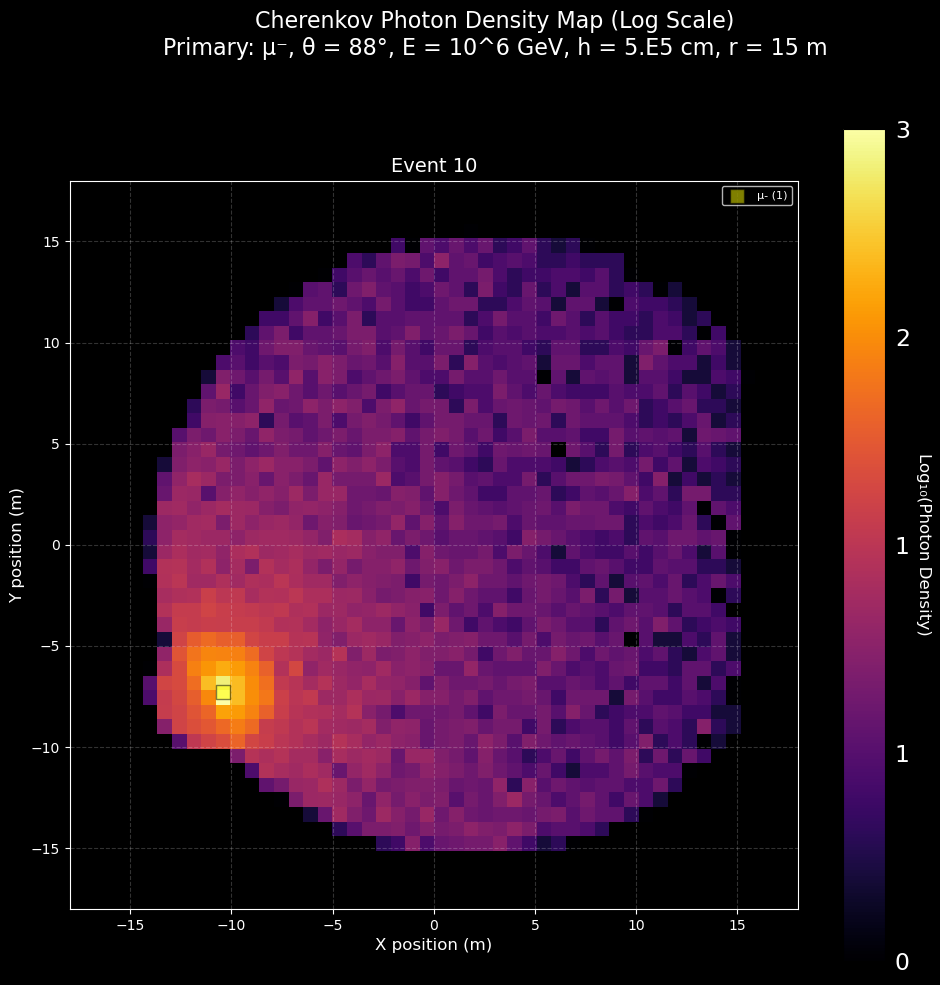

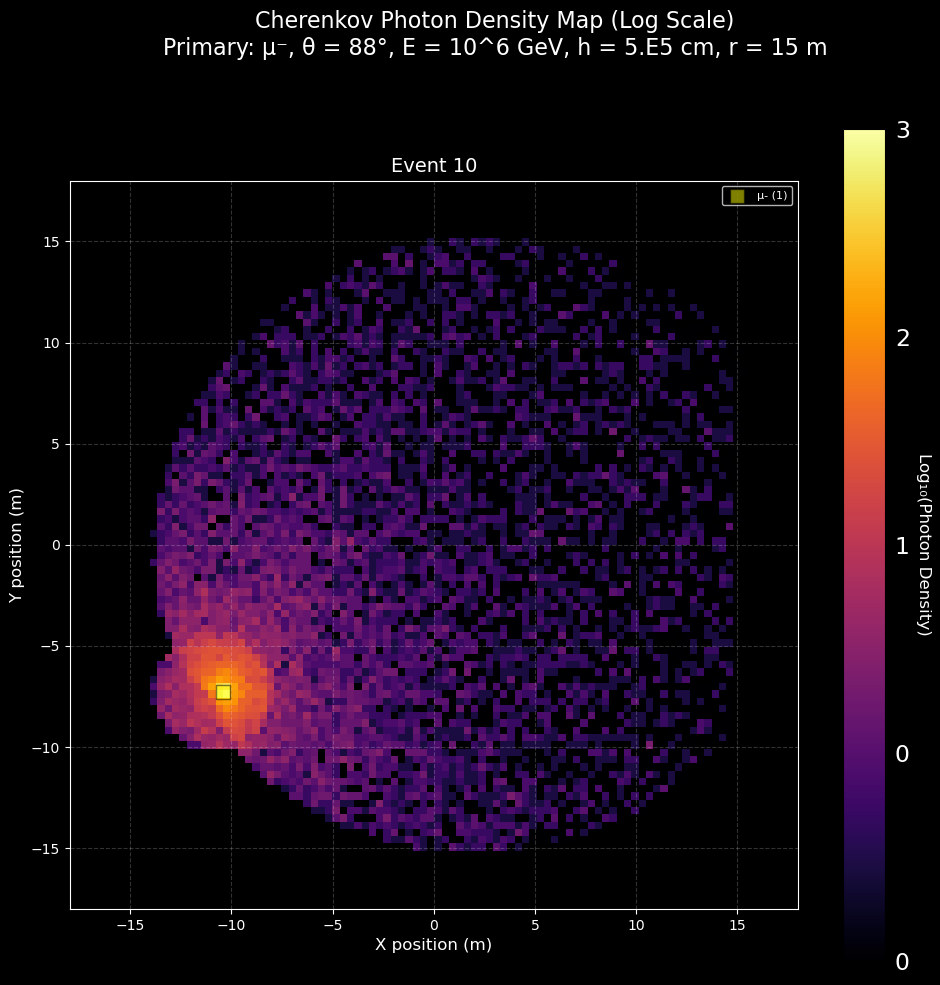

In [64]:
#log scale for the plots
# Define the parameters
zenith = 88  #  available: 0 30 60 88 degrees
E_mag = 6  # available: 1.00E6, 1.00E5, 1.00E4, 1.00E3, 1.00E1 GeV
particle = 6  # 5 is mu+, 6 is mu-
production_height = "5.E5"  # available: 10.E5 20.E5 cm
tele_radi = "1500"  # telescope radius in cm, available:  1500 cm
id = 10
# Create the plot
plot_1_events_with_ground_particles(id, particle, zenith, E_mag, production_height, tele_radi, num_bins=50, scale="log", plotting=False)
plot_1_events_with_ground_particles(id, particle, zenith, E_mag, production_height, tele_radi, num_bins=100, scale="log", plotting=True)

In [12]:
from read_telescope import IACTFile
def pde_vs_wavelength(wl):
    wavelength = np.array([300, 320, 340, 360, 380, 400, 420, 440, 480, 500, 520, 560, 600, 640, 660, 700])
    pde = np.array([0.28, 0.38, 0.38, 0.38, 0.44, 0.46, 0.48, 0.48, 0.5, 0.5, 0.48, 0.4, 0.34, 0.28, 0.26, 0.22])
    wl1 = int(np.round(wl/20,0)*20)
    index = np.where(wavelength == wl1)[0]
    return pde[index][0] if index.size > 0 else 0.22  # Default value if wavelength not found

def survive_photon(wavelength, emission_height, emission_angle_rad, atmos):
    """Calculate survival probability for a photon"""
    cos_emission_angle = np.cos(emission_angle_rad)  # cos of emission angle
    survival_prob, _ = atmos.prob_atm_absorbed(wavelength, emission_height, cos_emission_angle)
    survival_prob *= pde_vs_wavelength(wavelength)  # Apply the quantum efficiency
    survival_prob *= 0.92 #Transmission through the 6 mm thick entrance window of the camera
    survival_prob *= 0.85 #Reflection losses at the mirror surface
    check_survival = np.random.uniform(0, 1)
    if check_survival < survival_prob:
        return True
    else:
        return False

def filter_photons(x_shower, y_shower, T, wavelength, zem, theta, atmos):
    print(f"Number of photons: {len(wavelength)}")
    # Check if photon survive:
    wavelength_new = np.array(wavelength)
    mask = wavelength_new < 700  # filter out wavelengths greater than 700 nm
    wavelength_new = wavelength_new[mask]
    zem_new = np.array(zem)[mask]
    x_shower_new = x_shower[mask]
    y_shower_new = y_shower[mask]
    time_new = T[mask]
    i=0
    for j in range(len(wavelength_new)):
        if not survive_photon(wavelength_new[j], zem_new[j] / 100, theta, atmos):
            wavelength_new[j] = 0  # Set to zero if photon does not survive
            i+=1
    # Filter out photons does not survive
    mask = wavelength_new > 0
    x_shower_new = x_shower_new[mask]
    y_shower_new = y_shower_new[mask]
    wavelength_new = wavelength_new[mask]
    zem_new = zem_new[mask] 
    time_new = time_new[mask]
    print(f"Number of photons after filtering: {len(time_new)}")
    
    return x_shower_new, y_shower_new, time_new, wavelength_new, zem_new


def get_photon_bunches(input_files, atmos):
    Event = []
    for i in range(len(input_files)):
        with IACTFile(input_files[i]) as f:
            events = iter(f)
            event = next(events)
            azimuth = (event.header['azimuth'])
            theta = (event.header['zenith'])
            #print(f"Azimuth: {azimuth}, Zenith: {theta}")
            #print((event.photon_bunches[0]['wavelength']))
            X = event.photon_bunches[0]['x'] #in cm
            Y = event.photon_bunches[0]['y'] #in cm
            T = event.photon_bunches[0]['time'] #in ns
            wavelength = event.photon_bunches[0]['wavelength'] #in nm
            zem = event.photon_bunches[0]['zem'] 
            azimuth_rad = -azimuth # azimuth angle in rad
            theta_rad = (theta) # zenith angle in rad
            #Convert to shower coordinates
            x_shower = (np.array(X)*np.cos(azimuth_rad) - np.array(Y)*np.sin(azimuth_rad))*np.cos(theta_rad)
            y_shower = np.array(X)*np.sin(azimuth_rad) + np.array(Y)*np.cos(azimuth_rad)
            x_shower_new, y_shower_new, time_new, wavelength_new, zem_new = filter_photons(x_shower, y_shower, T, wavelength, zem, theta_rad, atmos)
            zem_new = zem_new -294400 # in cm 
            Event.append({
                'x_shower': x_shower_new,
                'y_shower': y_shower_new,
                'time': time_new,
                'wavelength': wavelength_new,
                'zem': zem_new,
                'theta': theta_rad
            })
    return Event

def extract_data_from_file(input_files, atmos, zenith, tele_radi):
    x_shower_new = []
    y_shower_new = []
    wavelength_new = []
    zem_new = []
    for i in range(len(input_files)):
        events = get_photon_bunches([input_files[i]], atmos)
        for event in events:
            x_shower_new.extend(event['x_shower'])
            y_shower_new.extend(event['y_shower'])
            wavelength_new.extend(event['wavelength'])
            zem_new.extend(event['zem'])
            time_new = event['time']

    x_shower_new = np.array(x_shower_new)
    y_shower_new = np.array(y_shower_new)
    wavelength_new = np.array(wavelength_new)
    zem_new = np.array(zem_new)
    time_new = np.array(time_new)

    mask = x_shower_new**2 + y_shower_new**2 < (float(tele_radi)*1.2)**2  # Filter photons within the telescope radius
    x_shower_new = x_shower_new[mask]
    y_shower_new = y_shower_new[mask]
    wavelength_new = wavelength_new[mask]
    zem_new = zem_new[mask]
    time_new = time_new[mask]
    c = 299792458  # Speed of light in m/s
    Cherenkov_angle = 0.024491836157763806658633150676496749860251520666937 # Cherenkov angle in radians, can be adjusted
    T_new = ((zem_new/100)/(c*np.cos(np.radians(zenith)*np.cos(Cherenkov_angle))))*1e9   # Get the arrval time of the photons in nano seconds
    t = T_new + time_new # Time photon arrive at the detector since the first interaction
    return t, x_shower_new, y_shower_new, wavelength_new, zem_new

In [13]:
ID = [1]
# Define the parameters
zenith = 88  #  available: 0 30 60 88 degrees
E_mag = 6  # available: 1.00E6, 1.00E5, 1.00E4, 1.00E3, 1.00E1 GeV
particle = 6  # 5 is mu+, 6 is mu-
production_height = "20.E5"  # available: 10.E5 20.E5 cm
tele_radi = "300."  # telescope radius in cm, available:  1500 cm
input_files = [
        f"/uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_h{production_height}_r{tele_radi}_Trinity/out_sib23d-pId{particle}-En1.00E{E_mag}-{zenith}/OUTPUT_1.00E{E_mag}_{particle}_{zenith}_{100+i}/telescope.dat"
        for i in ID
    ]
T_photon, X_photon, Y_photon, W_photon, Z_photon = extract_data_from_file(input_files, atmos, zenith, tele_radi)

Number of photons: 792
Number of photons after filtering: 2


Number of photons: 56954
Number of photons after filtering: 178


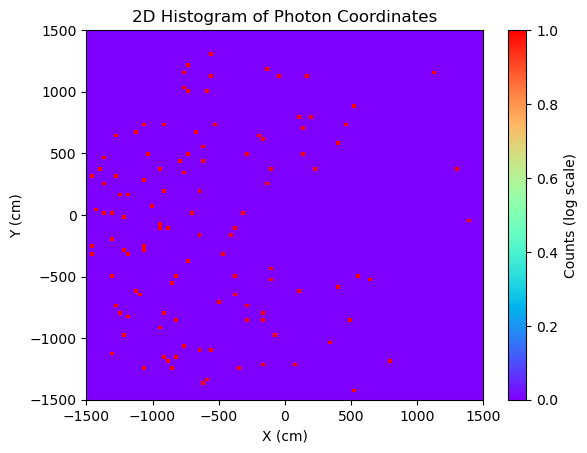

In [13]:
ID = [1]
for i in ID:
    id = [i]
    input_files = [
        f"/uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_h{production_height}_r{tele_radi}_Trinity/out_sib23d-pId{particle}-En1.00E{E_mag}-{zenith}/OUTPUT_1.00E{E_mag}_{particle}_{zenith}_{100+i}/telescope.dat"
        for i in id
    ]
    T_photon, X_photon, Y_photon, W_photon, Z_photon = extract_data_from_file(input_files, atmos, zenith, tele_radi)
    plt.hist2d(X_photon, Y_photon, bins=100, range=[[-1500, 1500], [-1500, 1500]], cmap='rainbow')
    plt.colorbar(label='Counts (log scale)')
    plt.xlabel('X (cm)')
    plt.ylabel('Y (cm)')
    plt.title('2D Histogram of Photon Coordinates')
    plt.xscale('linear')
    plt.yscale('linear')
    plt.show()

Plotting event 1: /uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_h20.E5_r300._Trinity/out_sib23d-pId6-En1.00E6-88/OUTPUT_1.00E6_6_88_101/telescope.dat with particles from /uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_h20.E5_r300._Trinity/out_sib23d-pId6-En1.00E6-88/OUTPUT_1.00E6_6_88_101/DAT000101
angles: -1.390133 1.5358897
Atmospheric extinction model: CORSIKA
VAtmosAbsorption: reading atmospheric extinction file (from CORSIKA): /uufs/chpc.utah.edu/common/home/u1520754/corsika-78010/run/atmabs.dat
Number of photons: 792
muon Position in cm -3029560.539959336 14763849.423775071
Plotting event 2: /uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_h20.E5_r300._Trinity/out_sib23d-pId6-En1.00E6-88/OUTPUT_1.00E6_6_88_102/telescope.dat with particles from /uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_h20.E5_r300._Trinity/out_sib23d-pId6-En1.00E6-88/OUTPUT_1.00E6_6_88_102/DAT000102
angles: -1.3993127 1.5358897
Atmospheric extincti

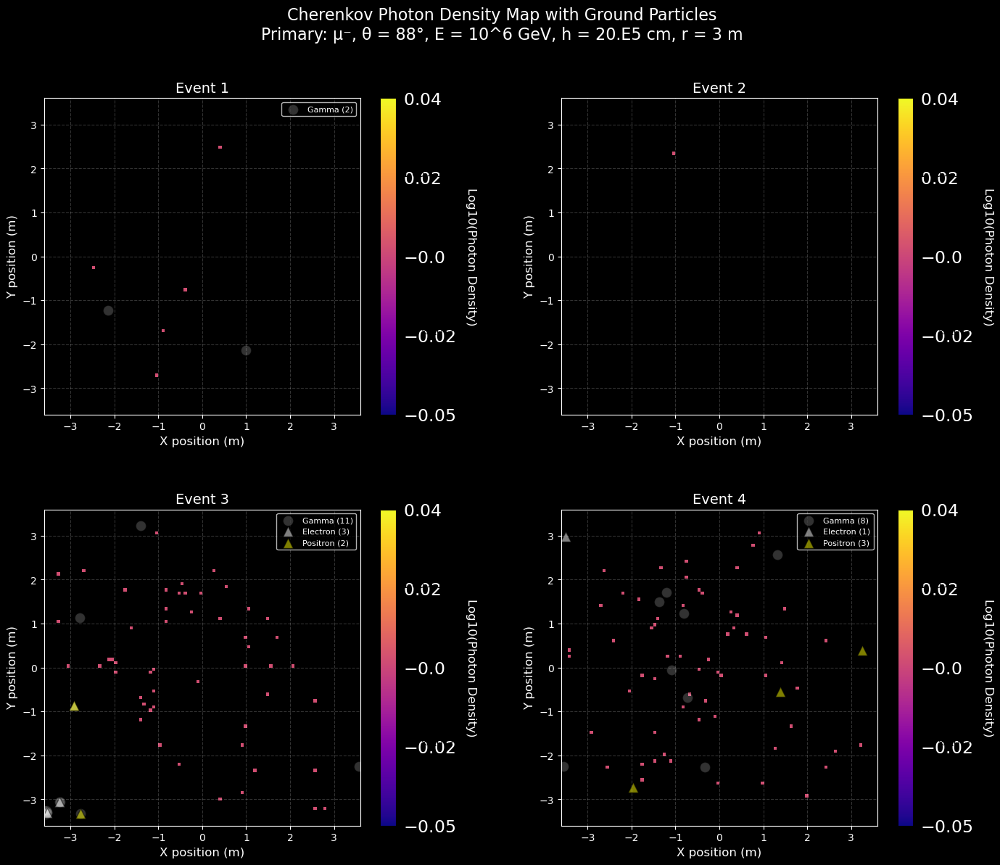

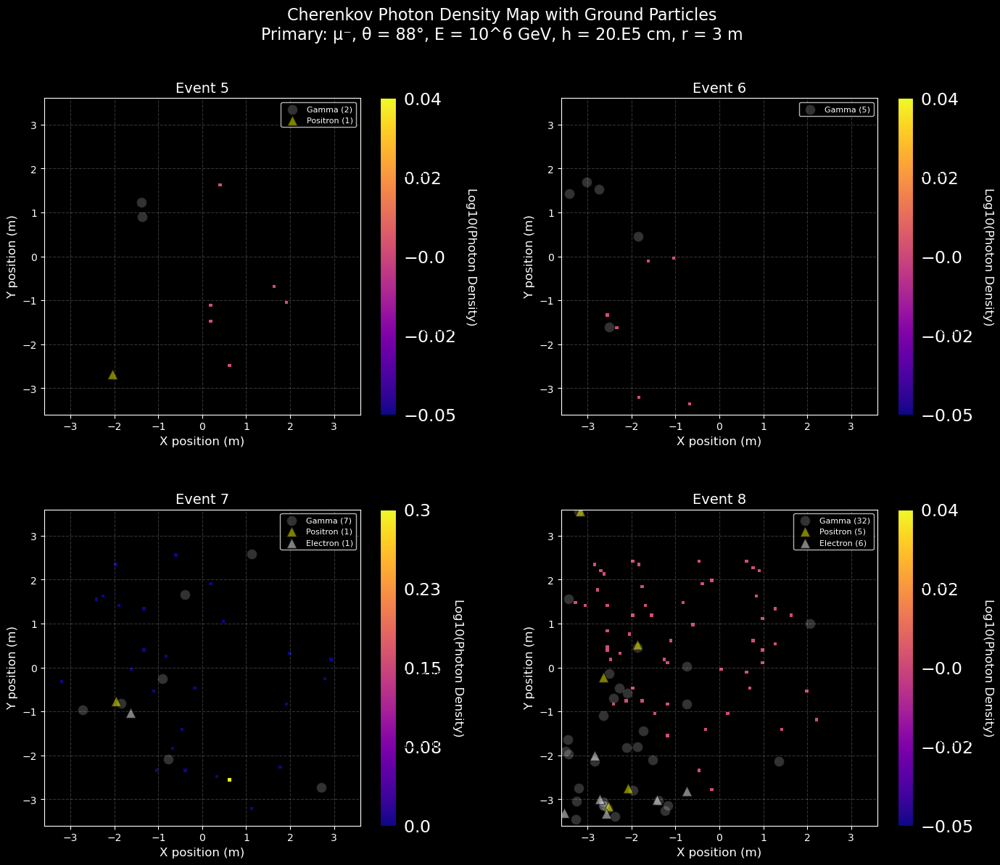

In [14]:
#ID = [1]
# Define the parameters
zenith = 88  #  available: 0 30 60 88 degrees
E_mag = 6  # available: 1.00E6, 1.00E5, 1.00E4, 1.00E3, 1.00E1 GeV
particle = 6  # 5 is mu+, 6 is mu-
production_height = "20.E5"  # available: 10.E5 20.E5 cm
tele_radi = "300."  # telescope radius in cm, available:  1500 cm
input_files = [
        f"/uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_h{production_height}_r{tele_radi}._Trinity/out_sib23d-pId{particle}-En1.00E{E_mag}-{zenith}/OUTPUT_1.00E{E_mag}_{particle}_{zenith}_{100+i}/telescope.dat"
        for i in ID
    ]
ID1 = [1, 2, 3, 4] 
ID2 = [5, 6, 7, 8]
ID = [1, 2, 3, 4] # ID of the events to plot
# Create the plot
plot_4_events_with_ground_particles(ID, particle, zenith, E_mag, production_height, tele_radi, num_bins=100)
plot_4_events_with_ground_particles(ID2, particle, zenith, E_mag, production_height, tele_radi, num_bins=100)

In [3]:
ID = [4]
# Define the parameters
zenith = 60  #  available: 0 30 60 88 degrees
E_mag = 6  # available: 1.00E6, 1.00E5, 1.00E4, 1.00E3, 1.00E1 GeV
particle = 6  # 5 is mu+, 6 is mu-
production_height = "20.E5"  # available: 10.E5 20.E5 cm
tele_radi = "1500"  # telescope radius in cm, available:  1500 cm
input_files = [
        f"/uufs/chpc.utah.edu/common/home/u1520754/corsika_results/notch_h{production_height}_r{tele_radi}./out_sib23d-pId{particle}-En1.00E{E_mag}-{zenith}./OUTPUT_1.00E{E_mag}_{particle}_{zenith}._{100+i}/telescope.dat"
        for i in ID
    ]
x_shower_new = []
y_shower_new = []
wavelength_new = []
zem_new = []
for i in range(len(input_files)):
    events = get_photon_bunches([input_files[i]], atmos)
    for event in events:
        x_shower_new.extend(event['x_shower'])
        y_shower_new.extend(event['y_shower'])
        wavelength_new.extend(event['wavelength'])
        zem_new.extend(event['zem'])
        time_new = event['time']

x_shower_new = np.array(x_shower_new)
y_shower_new = np.array(y_shower_new)
wavelength_new = np.array(wavelength_new)
zem_new = np.array(zem_new)
time_new = np.array(time_new)
import matplotlib.pyplot as plt
import numpy as np
#plot_results(x_shower_new, y_shower_new, wavelength_new, zem_new)
# Create animation
c = 299792458  # Speed of light in m/s
delta_t = 100  # Time window in nano second
T_new = ((zem_new/100)/(c*np.cos(np.radians(zenith))))*1e9   # Get the arrval time of the photons in nano seconds
t = T_new + time_new # Time photon arrive at the detector since the first interaction
N = (int((t.max() - t.min()) / delta_t) + 1) #number of steps
print("number of steps",N)
print("time range", t.min(), t.max())
fig = interactive_xy_histogram_window(x_shower_new, y_shower_new, t, 
                                    time_window=delta_t, n_time_steps=N, bins=100)
fig.show()

Number of photons: 7927
number of steps 6957
time range -17844.760776798128 677823.1360371371


In [4]:
# Example usage (you would call this with your actual data):
save_plotly_animation_to_mp4(x_shower_new, y_shower_new, t, 
                              output_filename=f"zen{zenith}_E{E_mag}_p{particle}_h{production_height}_r{tele_radi}.mp4",
                              fps=10, time_window=delta_t, n_time_steps=N, bins=100)

Processing 6957 time windows for video...
Creating video with 56 frames...
Saving individual frames...
Saved frame 1/56
Saved frame 11/56
Saved frame 21/56
Saved frame 31/56
Saved frame 41/56
Saved frame 51/56
FFmpeg not available. GIF saved as zen60_E6_p6_h20.E5_r1500.gif


'zen60_E6_p6_h20.E5_r1500.mp4'